<a href="https://colab.research.google.com/github/nilaynishant/AIMLTutorial/blob/main/ChangeDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import gdown
import zipfile
import os

# Step 1: Download the file from Google Drive (replace with your file ID)
file_id = '18GuoCuBn48oZKAlEo-LrNwABrFhVALU-'  # Replace with your file ID
gdown.download(f'https://drive.google.com/uc?id={file_id}', 'downloaded_file.zip', quiet=False)

# Step 2: Create a 'train' directory to unzip the contents into
os.makedirs('train', exist_ok=True)

# Step 3: Unzip the file to the 'train' folder
with zipfile.ZipFile('downloaded_file.zip', 'r') as zip_ref:
    zip_ref.extractall('train')

print("Unzipped successfully into 'train' folder.")


Downloading...
From (original): https://drive.google.com/uc?id=18GuoCuBn48oZKAlEo-LrNwABrFhVALU-
From (redirected): https://drive.google.com/uc?id=18GuoCuBn48oZKAlEo-LrNwABrFhVALU-&confirm=t&uuid=1b87c423-8ce1-4364-bfce-297dfa693650
To: /content/downloaded_file.zip
100%|██████████| 1.72G/1.72G [00:14<00:00, 117MB/s]


Unzipped successfully into 'train' folder.


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Define a dataset class for LEVIR-CD
def load_image(path):
    """Helper function to load an image."""
    return Image.open(path)

class LEVIRCDDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        """
        Args:
            image_dir (str): Path to the dataset directory.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.image_dir = image_dir
        self.transform = transform
        self.image_pairs = self._get_image_pairs()

    def _get_image_pairs(self):
        """Retrieve all image pairs and labels."""
        pre_images = sorted(os.listdir(os.path.join(self.image_dir, 'A')))
        post_images = sorted(os.listdir(os.path.join(self.image_dir, 'B')))
        masks = sorted(os.listdir(os.path.join(self.image_dir, 'label')))

        pairs = [(os.path.join('A', pre), os.path.join('B', post), os.path.join('label', mask))
                 for pre, post, mask in zip(pre_images, post_images, masks)]
        return pairs

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        pre_image_path, post_image_path, mask_path = self.image_pairs[idx]
        pre_image = load_image(os.path.join(self.image_dir, pre_image_path))
        post_image = load_image(os.path.join(self.image_dir, post_image_path))
        mask = load_image(os.path.join(self.image_dir, mask_path))

        if self.transform:
            pre_image = self.transform(pre_image)
            post_image = self.transform(post_image)
            mask = self.transform(mask)

        return {'pre_image': pre_image, 'post_image': post_image, 'mask': mask}

In [ ]:
# Define the change detection model
class ChangeDetectionModel(nn.Module):
    def __init__(self):
        super(ChangeDetectionModel, self).__init__()
        base_model = models.resnet18(pretrained=True)
        self.encoder = nn.Sequential(*list(base_model.children())[:-2])
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 1, kernel_size=4, stride=4)  # Adjusted to output 256x256
        )

    def forward(self, pre_image, post_image):
        pre_features = self.encoder(pre_image)
        post_features = self.encoder(post_image)
        change_features = torch.abs(pre_features - post_features)
        output = self.decoder(change_features)
        return output

In [ ]:
# Set paths and hyperparameters
image_dir = "train"
batch_size = 16
epochs = 50
lr = 0.001

# Data transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# Dataset and DataLoader
train_dataset = LEVIRCDDataset(image_dir=image_dir, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Model, Loss, and Optimizer
model = ChangeDetectionModel().cuda()
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=lr)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 87.1MB/s]


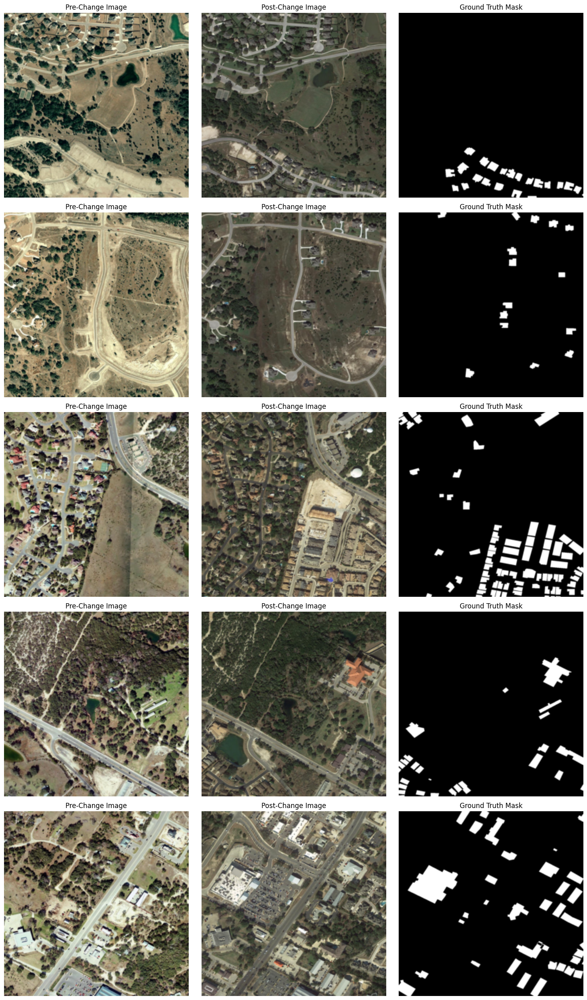

In [ ]:
# Visualize some samples from the dataset
def visualize_samples(dataset, num_samples=5):
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))
    for i in range(num_samples):
        sample = dataset[i]
        pre_image = sample['pre_image'].permute(1, 2, 0).numpy()
        post_image = sample['post_image'].permute(1, 2, 0).numpy()
        mask = sample['mask'].squeeze().numpy()

        axes[i, 0].imshow(pre_image)
        axes[i, 0].set_title('Pre-Change Image')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(post_image)
        axes[i, 1].set_title('Post-Change Image')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(mask, cmap='gray')
        axes[i, 2].set_title('Ground Truth Mask')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

visualize_samples(train_dataset)

In [ ]:
import torch.nn.functional as F

# Training loop
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for batch in train_loader:
        pre_images = batch['pre_image'].cuda()
        post_images = batch['post_image'].cuda()
        masks = batch['mask'].cuda()
        # Forward pass
        outputs = model(pre_images, post_images)
        # print(outputs.shape)
        outputs = F.interpolate(outputs, size=(256, 256), mode='bilinear', align_corners=False)
        # print(outputs.shape)
        loss = criterion(outputs, masks)
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader):.4f}")

# Save the model
torch.save(model.state_dict(), "change_detection_model.pth")

Epoch [1/50], Loss: 0.3640
Epoch [2/50], Loss: 0.2077
Epoch [3/50], Loss: 0.1876
Epoch [4/50], Loss: 0.1803
Epoch [5/50], Loss: 0.1715
Epoch [6/50], Loss: 0.1647
Epoch [7/50], Loss: 0.1588
Epoch [8/50], Loss: 0.1497
Epoch [9/50], Loss: 0.1417
Epoch [10/50], Loss: 0.1390
Epoch [11/50], Loss: 0.1977
Epoch [12/50], Loss: 0.1916
Epoch [13/50], Loss: 0.1787
Epoch [14/50], Loss: 0.1646
Epoch [15/50], Loss: 0.1562
Epoch [16/50], Loss: 0.1472
Epoch [17/50], Loss: 0.1343
Epoch [18/50], Loss: 0.1289
Epoch [19/50], Loss: 0.1350
Epoch [20/50], Loss: 0.1378
Epoch [21/50], Loss: 0.1306
Epoch [22/50], Loss: 0.1210
Epoch [23/50], Loss: 0.1196
Epoch [24/50], Loss: 0.1165
Epoch [25/50], Loss: 0.1158
Epoch [26/50], Loss: 0.1138
Epoch [27/50], Loss: 0.1533
Epoch [28/50], Loss: 0.1671
Epoch [29/50], Loss: 0.1303
Epoch [30/50], Loss: 0.1171
Epoch [31/50], Loss: 0.1153
Epoch [32/50], Loss: 0.1092
Epoch [33/50], Loss: 0.1072
Epoch [34/50], Loss: 0.1029
Epoch [35/50], Loss: 0.1016
Epoch [36/50], Loss: 0.0968
E

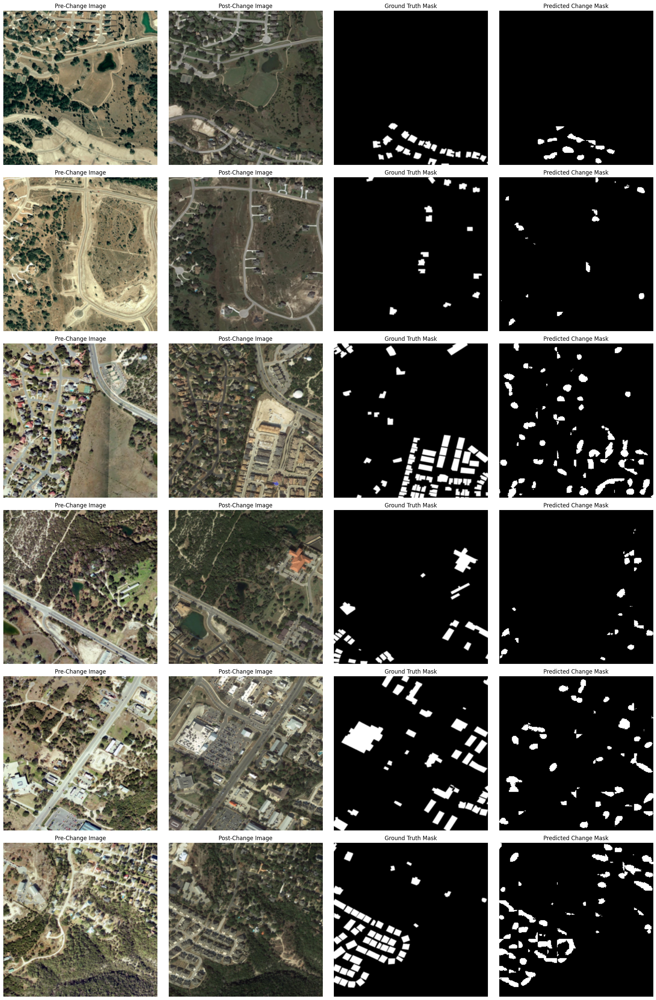

In [ ]:
# Predict and visualize results from the validation set
val_image_dir = "train"
val_dataset = LEVIRCDDataset(image_dir=val_image_dir, transform=transform)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

model.eval()

def visualize_predictions(loader, model, num_samples=6):
    fig, axes = plt.subplots(num_samples, 4, figsize=(20, 5 * num_samples))
    for i, batch in enumerate(loader):
        if i >= num_samples:
            break

        pre_image = batch['pre_image'].cuda()
        post_image = batch['post_image'].cuda()
        mask = batch['mask'].squeeze().cpu().numpy()

        with torch.no_grad():
            output = model(pre_image, post_image)
            prediction = (torch.sigmoid(output) > 0.5).float().squeeze().cpu().numpy()

        axes[i, 0].imshow(pre_image[0].permute(1, 2, 0).cpu().numpy())
        axes[i, 0].set_title('Pre-Change Image')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(post_image[0].permute(1, 2, 0).cpu().numpy())
        axes[i, 1].set_title('Post-Change Image')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(mask, cmap='gray')
        axes[i, 2].set_title('Ground Truth Mask')
        axes[i, 2].axis('off')

        axes[i, 3].imshow(prediction, cmap='gray')
        axes[i, 3].set_title('Predicted Change Mask')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

visualize_predictions(val_loader, model)

In [ ]:
# Model, Loss, and Optimizer
model = ChangeDetectionModel().cuda()
# Load pre-trained weights
model.load_state_dict(torch.load("change_detection_model.pth", weights_only=True))
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=lr)

# Continue training for 50 more epochs
additional_epochs = 50
for epoch in range(additional_epochs):
    model.train()
    running_loss = 0.0
    for batch in train_loader:
        pre_images = batch['pre_image'].cuda()
        post_images = batch['post_image'].cuda()
        masks = batch['mask'].cuda()

        # Forward pass
        outputs = model(pre_images, post_images)
        loss = criterion(outputs, masks)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{additional_epochs}], Loss: {running_loss/len(train_loader):.4f}")

# Save the updated model
torch.save(model.state_dict(), "change_detection_model_updated.pth")

Epoch [1/50], Loss: 0.0714
Epoch [2/50], Loss: 0.0634
Epoch [3/50], Loss: 0.0575
Epoch [4/50], Loss: 0.0543
Epoch [5/50], Loss: 0.0518
Epoch [6/50], Loss: 0.0522
Epoch [7/50], Loss: 0.0498
Epoch [8/50], Loss: 0.0492
Epoch [9/50], Loss: 0.0487
Epoch [10/50], Loss: 0.0477
Epoch [11/50], Loss: 0.0466
Epoch [12/50], Loss: 0.0457
Epoch [13/50], Loss: 0.0453
Epoch [14/50], Loss: 0.0454
Epoch [15/50], Loss: 0.0435
Epoch [16/50], Loss: 0.0426
Epoch [17/50], Loss: 0.0425
Epoch [18/50], Loss: 0.0429
Epoch [19/50], Loss: 0.0421
Epoch [20/50], Loss: 0.0410
